# Graph-based Recommender System for Bipartite Network  

## Step 1. Data pre-processing and baseline content-based / user-based filtering recommender system

In [410]:
import os
import pandas as pd
import numpy as np
import math
import re
import matplotlib.pyplot as plt

import graph_process

In [438]:
df_movies_path = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ml-1m/movies.dat'
df_ratings_path = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ml-1m/ratings.dat'
df_users_path = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ml-1m/users.dat'

movie_colnames = ['movieId', 'title', 'genres'] 
rating_colnames = ['userId', 'movieId', 'rating', 'timestamp'] 
user_colnames = ['userId', 'gender', 'age', 'occupation', 'zip_code'] 

df_movies = graph_process.load_table(df_movies_path, movie_colnames)
df_ratings = graph_process.load_table(df_ratings_path, rating_colnames).iloc[::10].reset_index(drop=True)
df_users = graph_process.load_table(df_users_path, user_colnames)

In [439]:
'''
df_links = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/links.csv'
df_movies = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/movies.csv'
df_ratings = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ratings.csv'
df_tags = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/tags.csv'


# load original sub-dataset
df_links = graph_process.load_csv(df_links)
df_movies = graph_process.load_csv(df_movies)
df_ratings = graph_process.load_csv(df_ratings)
df_tags = graph_process.load_csv(df_tags)
'''

"\ndf_links = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/links.csv'\ndf_movies = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/movies.csv'\ndf_ratings = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ratings.csv'\ndf_tags = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/tags.csv'\n\n\n# load original sub-dataset\ndf_links = graph_process.load_csv(df_links)\ndf_movies = graph_process.load_csv(df_movies)\ndf_ratings = graph_process.load_csv(df_ratings)\ndf_tags = graph_process.load_csv(df_tags)\n"

In [440]:
df_movies.head(2)

,movieId,title,genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy


In [441]:
df_ratings.head(2)

,userId,movieId,rating,timestamp
0,1,1193,5,978300760
1,1,595,5,978824268


In [442]:
df_ratings_useful = df_ratings[df_ratings.rating>=3]

user_set = df_ratings_useful.userId.unique()
movie_set = df_movies.movieId.unique()

In [443]:
genres = ["Action", "Adventure", "Animation", "Children", "Children's", "Comedy", "Crime", "Documentary", "Drama", "Fantasy", "Film-Noir", "Horror", "Musical", "Mystery", "Romance", "Sci-Fi", "Thriller", "War", "Western", "IMAX"]
for i in genres: df_movies[i] = None

In [444]:
for i in range(len(df_movies)):
    genres = df_movies.loc[i, 'genres'].split('|')
    for category in genres:
        df_movies.loc[i, category] = 1

df_movies = df_movies.fillna(0)
df_movies['Children'] = df_movies['Children'].astype('int')
df_movies['Children'] = df_movies['Children'] + df_movies["Children's"]
df_movies = df_movies.drop(columns=["Children's"])

In [445]:
df_movies.head(2)

,movieId,title,genres,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,...,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,IMAX
0,1,Toy Story (1995),Animation|Children's|Comedy,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,Jumanji (1995),Adventure|Children's|Fantasy,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [446]:
all_genres = list(df_movies.columns[3:])

### Following movie_table is the final movie recommendation look up table we want.

In [454]:
movie_table = dict()
for genres in all_genres:
    movie_table[genres] = dict()
    for i in list(df_movies[df_movies[genres]==1].movieId):  # i is movieId in corresponding genres
        movie_table[genres][str(i)] = len(df_ratings_useful[df_ratings_useful.movieId==i])  # rated times of each movieId in corresponding genres
    movie_table[genres] = dict(sorted(movie_table[genres].items(), key=lambda x: x[1], reverse=True))

In [456]:
# movie_table['Action']   # {'genres': {'movieId': 'rated times'}}

### Now we need to build the user_genres look up table

In [460]:
user_table  = {}

for user in user_set:
    movie_rated_by_user = list(df_ratings_useful[df_ratings_useful.userId==user].movieId)   # all movies rated by each user
    user_table[str(user)] = {}
    user_genres = []

    for movie in movie_rated_by_user:
        df = df_movies[df_movies.movieId==movie]
        for col in list(df_movies.columns)[3:]:
            if df[col].any()==1:
                user_genres.append(col)                 # all genres (including repeat genres in user_genres list)

    for i in user_genres:
        if i not in user_table[str(user)].keys():
            user_table[str(user)][i] = 1
        else: 
            user_table[str(user)][i] += 1

    user_table[str(user)] = dict(sorted(user_table[str(user)].items(), key=lambda x: x[1], reverse=True))

In [461]:
print(len(user_table))
user_table['1']              # {'userId': {'genres': 'rated times'}}

6020


{'Animation': 4, 'Children': 4, 'Comedy': 3, 'Drama': 1, 'Musical': 1}

In [462]:
import numpy as np

# Save
np.save('./data/user_table.npy', user_table) 
np.save('./data/movie_table.npy', movie_table) 

In [251]:
# Load
'''
movie_table = np.load('./data/movie_table.npy', allow_pickle = True).item()
user_table = np.load('./data/user_table.npy', allow_pickle = True).item()
'''

### Then we can do recommendation for evaluation

In [488]:
def recommendation(userId, user_table, movie_table):
    res = []
    user_genres = list(user_table[userId].keys())[:3]       # take top 5 genres for each user
    
    for genres in user_genres:
        res.extend(list(movie_table[genres].keys())[:2])        # take top 2 movies for each genres
    
    return res

In [489]:
userId = '1'
res = recommendation(userId, user_table, movie_table)


In [490]:
userId = ['1', '20', '100', '500', '1000'] 
rec_movies = []

for user in userId:
    movies = []
    res = recommendation(user, user_table, movie_table)
    for i in res: movies.append(df_movies[df_movies.movieId==int(i)]['title'].unique())
    rec_movies.append(movies)


In [492]:
df_rec = pd.DataFrame(columns=['userId', 'rec_movie1', 'rec_movie2', 'rec_movie3', 'rec_movie4', 'rec_movie5', 'rec_movie6'])
df_rec.userId = userId

In [498]:
for i in range(len(rec_movies)):
    df_rec.iloc[i, 1:] = rec_movies[i]


In [499]:
df_rec

,userId,rec_movie1,rec_movie2,rec_movie3,rec_movie4,rec_movie5,rec_movie6
0,1,[Toy Story (1995)],"[Bug's Life, A (1998)]",[E.T. the Extra-Terrestrial (1982)],[Toy Story (1995)],[American Beauty (1999)],[Shakespeare in Love (1998)]
1,20,[Star Wars: Episode IV - A New Hope (1977)],[Star Wars: Episode V - The Empire Strikes Bac...,[Star Wars: Episode IV - A New Hope (1977)],[Star Wars: Episode V - The Empire Strikes Bac...,[L.A. Confidential (1997)],[2001: A Space Odyssey (1968)]
2,100,[Star Wars: Episode IV - A New Hope (1977)],[Star Wars: Episode V - The Empire Strikes Bac...,[Star Wars: Episode IV - A New Hope (1977)],[Star Wars: Episode V - The Empire Strikes Bac...,[American Beauty (1999)],[Schindler's List (1993)]
3,500,[American Beauty (1999)],[Shakespeare in Love (1998)],[E.T. the Extra-Terrestrial (1982)],[Toy Story (1995)],[Toy Story (1995)],"[Bug's Life, A (1998)]"
4,1000,[American Beauty (1999)],[Schindler's List (1993)],[Schindler's List (1993)],[Star Wars: Episode V - The Empire Strikes Bac...,[Star Wars: Episode IV - A New Hope (1977)],[Star Wars: Episode V - The Empire Strikes Bac...


### ------------------------------- Content-based filtering baseline finished here!

## Step 2. Graph construction.

* We need to construct graph network based on processed data and to do network visualization

In [156]:
import networkx as nx
from networkx.algorithms import bipartite
import matplotlib.pyplot as plt
import collections
import random
import graph_process
import pandas as pd
import numpy as np

"\ndf_links = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/links.csv'\ndf_movies = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/movies.csv'\ndf_ratings = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ratings.csv'\ndf_tags = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/tags.csv'\n\n# load original dataset\ndf_links = graph_process.data_load(df_links)\ndf_movies = graph_process.data_load(df_movies)\ndf_ratings = graph_process.data_load(df_ratings)\ndf_tags = graph_process.data_load(df_tags)\n"

In [157]:
df_movies_path = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ml-1m/movies.dat'
df_ratings_path = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ml-1m/ratings.dat'
df_users_path = '/Users/xinsun/Dev_env/Graph-Network-Analysis-Recommendation/Graph-Network-Analysis-Recommendation/MovieLen/data/ml-1m/users.dat'

movie_colnames = ['movieId', 'title', 'genres'] 
rating_colnames = ['userId', 'movieId', 'rating', 'timestamp'] 
user_colnames = ['userId', 'gender', 'age', 'occupation', 'zip_code'] 

df_movies = graph_process.load_table(df_movies_path, movie_colnames)
df_ratings = graph_process.load_table(df_ratings_path, rating_colnames).iloc[::10].reset_index(drop=True)
df_users = graph_process.load_table(df_users_path, user_colnames)

In [158]:
print(len(df_ratings))
df_ratings.head(2)

100021


,userId,movieId,rating,timestamp
0,1,1193,5,978300760
1,1,595,5,978824268


In [159]:
print(len(df_movies))
df_movies.head(2)

3883


,movieId,title,genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy


In [160]:
print(len(df_users))
df_users.head(2)

6040


,userId,gender,age,occupation,zip_code
0,1,F,1,10,48067
1,2,M,56,16,70072


In [161]:
# new movie ID
movie_id = df_ratings['movieId'].unique()
movie_set = []
for i, movie in enumerate(movie_id):
    movie_set.append([movie, 'm'+str(i)])

df_movie = pd.DataFrame(movie_set, columns=['movieId', 'movieId_new'])
df_ratings = pd.merge(left=df_ratings, right=df_movie, on='movieId')

# new user ID
df_ratings['userId_new'] = df_ratings['userId'].astype('int') - 1
df_ratings['userId_new'] = df_ratings['userId_new'].astype('str')

df_ratings['userId_new'] = 'u' + df_ratings['userId_new']
df_ratings['movieId_new'] = df_ratings['movieId_new'].astype('str')

In [162]:
'''
movie_id = df_ratings['movieId'].unique()
print(len(movie_id))
np.sort(movie_id)

user_id = df_ratings['userId'].unique()
print(len(user_id))
np.sort(user_id)
'''

"\nmovie_id = df_ratings['movieId'].unique()\nprint(len(movie_id))\nnp.sort(movie_id)\n\nuser_id = df_ratings['userId'].unique()\nprint(len(user_id))\nnp.sort(user_id)\n"

* Now we use networkX to construct the undireted bipartite graph.

In [163]:
G = nx.from_pandas_edgelist(df_ratings, "movieId_new", "userId_new", edge_attr=True, create_using=nx.Graph())
len(G)

9366

In [164]:
df_ratings.head(2)

,userId,movieId,rating,timestamp,movieId_new,userId_new
0,1,1193,5,978300760,m0,u0
1,2,1193,5,978298413,m0,u1


* Extracting all nodes and edges from raw data to form the graph network.

In [165]:
node_list = list(df_ratings.userId_new.unique()) + list(df_ratings.movieId_new.unique())
print(len(node_list))

edge_list = [(df_ratings.loc[i, 'userId_new'], df_ratings.loc[i, 'movieId_new']) for i in range(len(df_ratings))]
print(len(edge_list))

9366
100021


### Now we start to construct the graph

In [166]:
G = nx.Graph()

# add nodes
G.add_nodes_from(node_list)

# add edges
G.add_edges_from(edge_list)

# construct bipartite graph
B = nx.Graph()

# Add nodes with the node attribute "bipartite"
B.add_nodes_from(list(df_ratings.userId_new.unique()), bipartite=0)

B.add_nodes_from(list(df_ratings.movieId_new.unique()), bipartite=1)

# Add edges only between nodes of opposite node sets
B.add_edges_from(edge_list)

* Visualization of constructed graph

In [59]:
'''
# Separate by group
l, r = nx.bipartite.sets(B)
pos = {}

# Update position for node from each group
pos.update((node, (1, index)) for index, node in enumerate(l))
pos.update((node, (2, index)) for index, node in enumerate(r))

color = bipartite.color(B)

color_dict = {0:'b',1:'r'}

color_list = [color_dict[i[1]] for i in B.nodes.data('bipartite')]

nx.draw(B, pos=pos, with_labels=False, node_color = color_list)
plt.show()
'''

"\n# Separate by group\nl, r = nx.bipartite.sets(B)\npos = {}\n\n# Update position for node from each group\npos.update((node, (1, index)) for index, node in enumerate(l))\npos.update((node, (2, index)) for index, node in enumerate(r))\n\ncolor = bipartite.color(B)\n\ncolor_dict = {0:'b',1:'r'}\n\ncolor_list = [color_dict[i[1]] for i in B.nodes.data('bipartite')]\n\nnx.draw(B, pos=pos, with_labels=False, node_color = color_list)\nplt.show()\n"

In [60]:
print(G.number_of_nodes())
print(G.number_of_edges())

9366
100021


In [61]:
print(list(G.adj['m37']))  # or list(G.neighbors(1))
print(G.degree['m37'])  # the number of edges incident to node

['u4', 'u130', 'u172', 'u423', 'u838', 'u1087', 'u1259', 'u1302', 'u1394', 'u1473', 'u1483', 'u1583', 'u1757', 'u1835', 'u1979', 'u3517', 'u3823', 'u4168', 'u4276', 'u5106', 'u5171', 'u5348', 'u5392', 'u5620', 'u5762', 'u5873', 'u6034', 'u6035']
28


In [167]:
nx.connected_components(G)

<generator object connected_components at 0xa28498408>

In [168]:
# degree of each node
# sorted(d for n, d in G.degree())

In [169]:
# clustering coeffieicnt of each node
# nx.clustering(G)

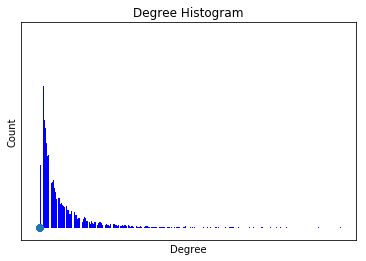

In [67]:
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)  # degree sequence
# print "Degree sequence", degree_sequence
degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

fig, ax = plt.subplots()
plt.bar(deg, cnt, width=0.80, color='b')

plt.title("Degree Histogram")
plt.ylabel("Count")
plt.xlabel("Degree")
ax.set_xticks([d + 0.4 for d in deg])
ax.set_xticklabels(deg)

# draw graph in inset
# plt.axes([0.4, 0.4, 0.5, 0.5])
Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])
pos = nx.spring_layout(G)
# plt.axis('off')
nx.draw_networkx_nodes(G, pos, node_size=20)
nx.draw_networkx_edges(G, pos, alpha=0.4)

plt.show()

## Step 3. Graph analysis and graph related features

* Degree distribution
* Degree centrality
* Cumulative degree distribution
* Clustering coefficients
* Preferential attachment
* Growth
* Edge weight distribution
* Distance distribution

In [170]:
df_all = pd.merge(left=df_ratings, right=df_movies, on='movieId')
df_all = pd.merge(left=df_all, right=df_users, on='userId')

In [171]:
df_all.head(2) 

,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,gender,age,occupation,zip_code
0,1,1193,5,978300760,m0,u0,One Flew Over the Cuckoo's Nest (1975),Drama,F,1,10,48067
1,1,595,5,978824268,m1,u0,Beauty and the Beast (1991),Animation|Children's|Musical,F,1,10,48067


* Add degree of each node as feature

In [172]:
# add degree of each node as feature
movie_node = df_ratings['movieId_new'].unique()
movie_node_degree = []
for i, movie in enumerate(movie_node):
    movie_node_degree.append([movie, G.degree[movie]])

user_node = df_ratings['userId_new'].unique()
user_node_degree = []
for i, user in enumerate(user_node):
    user_node_degree.append([user, G.degree[user]])


df_movie_degree = pd.DataFrame(movie_node_degree, columns=['movieId_new', 'movie_node_degree'])
df_user_degree = pd.DataFrame(user_node_degree, columns=['userId_new', 'user_node_degree'])

df_all = pd.merge(left=df_all, right=df_movie_degree, on='movieId_new')
df_all = pd.merge(left=df_all, right=df_user_degree, on='userId_new')

In [173]:
df_all.head(2)

,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,gender,age,occupation,zip_code,movie_node_degree,user_node_degree
0,1,1193,5,978300760,m0,u0,One Flew Over the Cuckoo's Nest (1975),Drama,F,1,10,48067,164,6
1,1,595,5,978824268,m1,u0,Beauty and the Beast (1991),Animation|Children's|Musical,F,1,10,48067,110,6


* Add Clustering coefficients of each node as feature

In [174]:
# add degree of each node as feature
movie_node = df_ratings['movieId_new'].unique()
movie_node_clustering = []
for i, movie in enumerate(movie_node):
    movie_node_clustering.append([movie, nx.clustering(G,movie)])

user_node = df_ratings['userId_new'].unique()
user_node_clustering = []
for i, user in enumerate(user_node):
    user_node_clustering.append([user, nx.clustering(G,user)])


df_movie_clustering = pd.DataFrame(movie_node_clustering, columns=['movieId_new', 'movie_node_clustering'])
df_user_clustering = pd.DataFrame(user_node_clustering, columns=['userId_new', 'user_node_clustering'])

df_all = pd.merge(left=df_all, right=df_movie_clustering, on='movieId_new')
df_all = pd.merge(left=df_all, right=df_user_clustering, on='userId_new')

In [175]:
df_all.head(2)

,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,gender,age,occupation,zip_code,movie_node_degree,user_node_degree,movie_node_clustering,user_node_clustering
0,1,1193,5,978300760,m0,u0,One Flew Over the Cuckoo's Nest (1975),Drama,F,1,10,48067,164,6,0,0
1,1,595,5,978824268,m1,u0,Beauty and the Beast (1991),Animation|Children's|Musical,F,1,10,48067,110,6,0,0


* Preferential attachment of each node as feature

In [176]:
preds = nx.preferential_attachment(G, [('m0', 'u0'), ('m1', 'u0')])

* Add detected Community of each node as feature

In [177]:
# clustering class
from networkx.algorithms import community
com = community.greedy_modularity_communities(G) 

community = dict()
for i in range(len(com)):
    community[i] = list(com[i])

In [184]:
print(len(com))
print(len(community))
len(community[0])

34
34


3159

In [190]:
com_list = []
for i in range(len(community)):
    for j in range(len(community[i])):
        com_list.append([i, community[i][j]])

df_community_movie = pd.DataFrame(com_list, columns=['community_movie', 'movieId_new'])
df_community_user = pd.DataFrame(com_list, columns=['community_user', 'userId_new'])

df_all = pd.merge(left=df_all, right=df_community_movie, left_on='movieId_new', right_on='movieId_new', left_index=False, right_index=False)
df_all = pd.merge(left=df_all, right=df_community_user, left_on='userId_new', right_on='userId_new', left_index=False, right_index=False)

In [193]:
df_all.head(2)

,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,gender,age,occupation,zip_code,movie_node_degree,user_node_degree,movie_node_clustering,user_node_clustering,community_movie,community_user
0,1,1193,5,978300760,m0,u0,One Flew Over the Cuckoo's Nest (1975),Drama,F,1,10,48067,164,6,0,0,0,2
1,1,595,5,978824268,m1,u0,Beauty and the Beast (1991),Animation|Children's|Musical,F,1,10,48067,110,6,0,0,2,2


In [194]:
df_all.columns[np.where(df_all.isna())[1]]

Index([], dtype='object')

* Add degree centrality of each node as feature

In [208]:
# add degree centrality of each node as feature
degree_centrality = nx.degree_centrality(G)

movie_node = df_ratings['movieId_new'].unique()
movie_node_dc = []
for i, movie in enumerate(movie_node):
    movie_node_dc.append([movie, degree_centrality[movie]])

user_node = df_ratings['userId_new'].unique()
user_node_dc = []
for i, user in enumerate(user_node):
    user_node_dc.append([user, degree_centrality[user]])

df_movie_dc = pd.DataFrame(movie_node_dc, columns=['movieId_new', 'movie_node_dc'])
df_user_dc = pd.DataFrame(user_node_dc, columns=['userId_new', 'user_node_dc'])

df_all = pd.merge(left=df_all, right=df_movie_dc, on='movieId_new')
df_all = pd.merge(left=df_all, right=df_user_dc, on='userId_new')

In [209]:
df_all.columns[np.where(df_all.isna())[1]]

Index([], dtype='object')

In [212]:
df_all.head(2)

,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,gender,age,occupation,zip_code,movie_node_degree,user_node_degree,movie_node_clustering,user_node_clustering,community_movie,community_user,movie_node_dc,user_node_dc
0,1,1193,5,978300760,m0,u0,One Flew Over the Cuckoo's Nest (1975),Drama,F,1,10,48067,164,6,0,0,0,2,0.017512,0.000641
1,1,595,5,978824268,m1,u0,Beauty and the Beast (1991),Animation|Children's|Musical,F,1,10,48067,110,6,0,0,2,2,0.011746,0.000641


## Step 4. Graph-based feature engineering & Embeddings.

In [216]:
import random
from tqdm import tqdm
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
%matplotlib inline

In [217]:
print(len(df_all['userId'].unique()))
print(len(df_all['movieId'].unique()))

df_all.head(1).append(df_all.tail(1))

6040
3326


,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,gender,age,occupation,zip_code,movie_node_degree,user_node_degree,movie_node_clustering,user_node_clustering,community_movie,community_user,movie_node_dc,user_node_dc
0,1,1193,5,978300760,m0,u0,One Flew Over the Cuckoo's Nest (1975),Drama,F,1,10,48067,164,6,0,0,0,2,0.017512,0.000641
100020,171,206,4,977167038,m1209,u170,Unzipped (1995),Documentary,F,50,17,55441,5,2,0,0,3,3,0.000534,0.000214


## Deep Walk algorithm and skip-gram to get embedding vector of users and movies

In [218]:
Gp = nx.from_pandas_edgelist(df_all, "movieId_new", "userId_new", edge_attr=True, create_using=nx.Graph())

len(Gp)

9366

In [219]:
# function to generate random walk sequences of nodes
def get_randomwalk(node, path_length):
    
    random_walk = [node]
    
    for i in range(path_length-1):
        temp = list(G.neighbors(node))
        temp = list(set(temp) - set(random_walk))    
        if len(temp) == 0:
            break

        random_node = random.choice(temp)
        random_walk.append(random_node)
        node = random_node
        
    return random_walk

In [220]:
get_randomwalk('m0', 10)

['m0',
 'u5904',
 'm664',
 'u389',
 'm885',
 'u3823',
 'm1588',
 'u2388',
 'm281',
 'u4407']

In [221]:
all_nodes = list(G.nodes())

random_walks = []

for n in tqdm(all_nodes):
    for i in range(5):
        random_walks.append(get_randomwalk(n,10))


# count of sequences
len(random_walks)

100%|██████████| 9366/9366 [00:13<00:00, 687.42it/s]


46830

In [223]:
from gensim.models import Word2Vec

import warnings
warnings.filterwarnings('ignore')

In [224]:
# train word2vec model
model = Word2Vec(window = 4, sg = 1, hs = 0,
                 negative = 10, # for negative sampling
                 alpha=0.03, min_alpha=0.0007, size=25,
                 seed = 14)

model.build_vocab(random_walks, progress_per=2)

In [225]:
model.train(random_walks, total_examples = model.corpus_count, epochs=20, report_delay=1)
print(model)

Word2Vec(vocab=9366, size=25, alpha=0.03)


In [226]:
# find top n similar nodes
model.similar_by_word('m0')

[('u2542', 0.8283175826072693),
 ('u4395', 0.814765453338623),
 ('u906', 0.796629786491394),
 ('u5289', 0.7895930409431458),
 ('u2531', 0.773542046546936),
 ('u1125', 0.7479276061058044),
 ('u1998', 0.7440029978752136),
 ('u1906', 0.7429147362709045),
 ('m976', 0.7412866950035095),
 ('u4641', 0.7406349182128906)]

In [246]:
def plot_nodes(word_list):
    X = model[word_list]
    
    # reduce dimensions to 2
    pca = PCA(n_components=2)
    result = pca.fit_transform(X)
    
    
    plt.figure(figsize=(15,15))
    # create a scatter plot of the projection
    plt.scatter(result[:, 0], result[:, 1])
    for i, word in enumerate(word_list):
        plt.annotate(word, xy=(result[i, 0], result[i, 1]))
        
    plt.show()

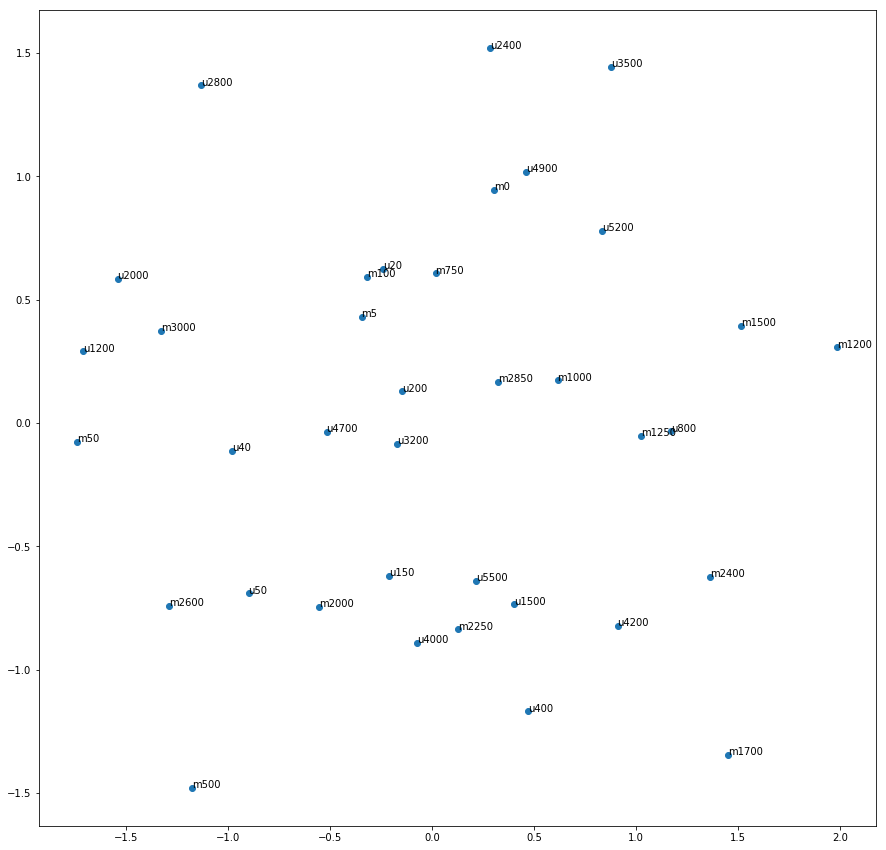

In [264]:
terms = ['u20', 'u40', 'u50', 'u150', 'u200', 'u400', 'u800', 'u1200', 'u1500', 'u2000', 'u2400', 'u2800', 'u3200', 'u3500', 'u4000', 'u4200', 'u4700', 'u4900', 'u5200', 'u5500',
'm0', 'm5', 'm50', 'm100', 'm500', 'm750', 'm1000', 'm1200', 'm1250', 'm1500', 'm1700', 'm2000', 'm2250', 'm2400', 'm2600', 'm2850', 'm3000']

plot_nodes(terms)


* add user gender as features

In [ ]:
df_all = df_all.join(pd.get_dummies(df_all["gender"],prefix='gender'))

In [270]:
df_all.head(2)

,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,gender,age,...,movie_node_degree,user_node_degree,movie_node_clustering,user_node_clustering,community_movie,community_user,movie_node_dc,user_node_dc,gender_F,gender_M
0,1,1193,5,978300760,m0,u0,One Flew Over the Cuckoo's Nest (1975),Drama,F,1,...,164,6,0,0,0,2,0.017512,0.000641,1,0
1,1,595,5,978824268,m1,u0,Beauty and the Beast (1991),Animation|Children's|Musical,F,1,...,110,6,0,0,2,2,0.011746,0.000641,1,0


* add user age as features

In [272]:
df_all = df_all.join(pd.get_dummies(df_all["age"],prefix='age'))

In [273]:
df_all.head(2)

,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,gender,age,...,user_node_dc,gender_F,gender_M,age_1,age_18,age_25,age_35,age_45,age_50,age_56
0,1,1193,5,978300760,m0,u0,One Flew Over the Cuckoo's Nest (1975),Drama,F,1,...,0.000641,1,0,1,0,0,0,0,0,0
1,1,595,5,978824268,m1,u0,Beauty and the Beast (1991),Animation|Children's|Musical,F,1,...,0.000641,1,0,1,0,0,0,0,0,0


In [274]:
df_all.columns

Index(['userId', 'movieId', 'rating', 'timestamp', 'movieId_new', 'userId_new',
       'title', 'genres', 'gender', 'age', 'occupation', 'zip_code',
       'movie_node_degree', 'user_node_degree', 'movie_node_clustering',
       'user_node_clustering', 'community_movie', 'community_user',
       'movie_node_dc', 'user_node_dc', 'gender_F', 'gender_M', 'age_1',
       'age_18', 'age_25', 'age_35', 'age_45', 'age_50', 'age_56'],
      dtype='object')

* add genres info as features

In [276]:
genres = ['Action', 'Adventure', 'Animation', 'Children', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Fantasy', 'Film-Noir', 'Horror', 'Musical', 'Mystery', 'Romance', 'Sci-Fi', 'Thriller', 'War', 'Western', 'IMAX']

for i in genres: df_all[i] = None

In [277]:
for i in range(len(df_all)):
    genres = df_all.loc[i, 'genres'].split('|')
    for category in genres:
        df_all.loc[i, category] = 1

df_all = df_all.fillna(0)

In [193]:
df_all.head(2).append(df_all.tail(1))

,userId,movieId,rating,timestamp,movieId_new,userId_new,title,genres,movie_node_degree,user_node_degree,...,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,IMAX
0,1,1193,5,978300760,m0,u0,One Flew Over the Cuckoo's Nest (1975),Drama,1.332667,-1.028425,...,0,0,0,0,0,0,0,0,0,0
1,1,2804,5,978300719,m1,u0,"Christmas Story, A (1983)",Comedy|Drama,0.815653,-1.028425,...,0,0,0,0,0,0,0,0,0,0
142886,2755,2607,5,973193782,m2477,u2754,Get Real (1998),Drama,-1.117982,-1.136245,...,0,0,0,0,0,0,0,0,0,0


In [278]:
df_all.columns

Index(['userId', 'movieId', 'rating', 'timestamp', 'movieId_new', 'userId_new',
       'title', 'genres', 'gender', 'age', 'occupation', 'zip_code',
       'movie_node_degree', 'user_node_degree', 'movie_node_clustering',
       'user_node_clustering', 'community_movie', 'community_user',
       'movie_node_dc', 'user_node_dc', 'gender_F', 'gender_M', 'age_1',
       'age_18', 'age_25', 'age_35', 'age_45', 'age_50', 'age_56', 'Action',
       'Adventure', 'Animation', 'Children', 'Comedy', 'Crime', 'Documentary',
       'Drama', 'Fantasy', 'Film-Noir', 'Horror', 'Musical', 'Mystery',
       'Romance', 'Sci-Fi', 'Thriller', 'War', 'Western', 'IMAX',
       'Children's'],
      dtype='object')

In [279]:
df_all = df_all.drop(columns=["timestamp", "title", "genres", "Children's", "zip_code"], inplace=False) 

* add user / movie embedding vector as features

In [280]:
# add movie embedding vector as feature
movie_emb = []

for movieId_new in df_all['movieId_new'].unique():
    movie_emb.append([movieId_new, model[movieId_new]])

df_movie_emb = pd.DataFrame(movie_emb, columns=['movieId_new', 'movieId_emb'])

df_all = pd.merge(left=df_all, right=df_movie_emb, on='movieId_new')

In [281]:
# add user embedding vector as feature
user_emb = []

for userId_new in df_all['userId_new'].unique():
    user_emb.append([userId_new, model[userId_new]])

df_user_emb = pd.DataFrame(user_emb, columns=['userId_new', 'user_emb'])

df_all = pd.merge(left=df_all, right=df_user_emb, on='userId_new')

In [282]:
df_all.head(2).append(df_all.tail(1))

,userId,movieId,rating,movieId_new,userId_new,gender,age,occupation,movie_node_degree,user_node_degree,...,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,IMAX,movieId_emb,user_emb
0,1,1193,5,m0,u0,F,1,10,164,6,...,0,0,0,0,0,0,0,0,"[-1.0498835, -0.9089129, 0.7536965, -0.1456113...","[-1.7766535, -0.9380263, 0.31698924, -0.264722..."
1,1,595,5,m1,u0,F,1,10,110,6,...,1,0,0,0,0,0,0,0,"[-0.77788013, -0.23418422, 0.08841071, 0.06856...","[-1.7766535, -0.9380263, 0.31698924, -0.264722..."
100020,171,206,4,m1209,u170,F,50,17,5,2,...,0,0,0,0,0,0,0,0,"[-1.5215973, 0.10502822, 0.43792346, 0.1344024...","[-1.3659006, -0.25509062, 0.5703715, 0.0133909..."


In [290]:
from sklearn import preprocessing

'''
movie_node_degree = pd.DataFrame(df_all['movie_node_degree'])
user_node_degree = pd.DataFrame(df_all['user_node_degree'])
scaler = preprocessing.StandardScaler()    
df_all['movie_node_degree'] = scaler.fit_transform(movie_node_degree)
df_all['user_node_degree'] = scaler.fit_transform(user_node_degree)
'''

scale = pd.DataFrame(df_all[['movie_node_degree', 'user_node_degree']])
scaler = preprocessing.StandardScaler()    
df_all[['movie_node_degree', 'user_node_degree']] = scaler.fit_transform(scale)

In [291]:
df_all.columns.unique()

Index(['userId', 'movieId', 'rating', 'movieId_new', 'userId_new', 'gender',
       'age', 'occupation', 'movie_node_degree', 'user_node_degree',
       'movie_node_clustering', 'user_node_clustering', 'community_movie',
       'community_user', 'movie_node_dc', 'user_node_dc', 'gender_F',
       'gender_M', 'age_1', 'age_18', 'age_25', 'age_35', 'age_45', 'age_50',
       'age_56', 'Action', 'Adventure', 'Animation', 'Children', 'Comedy',
       'Crime', 'Documentary', 'Drama', 'Fantasy', 'Film-Noir', 'Horror',
       'Musical', 'Mystery', 'Romance', 'Sci-Fi', 'Thriller', 'War', 'Western',
       'IMAX', 'movieId_emb', 'user_emb'],
      dtype='object')

In [292]:
df_all.columns[25:44]

Index(['Action', 'Adventure', 'Animation', 'Children', 'Comedy', 'Crime',
       'Documentary', 'Drama', 'Fantasy', 'Film-Noir', 'Horror', 'Musical',
       'Mystery', 'Romance', 'Sci-Fi', 'Thriller', 'War', 'Western', 'IMAX'],
      dtype='object')

In [293]:
movie_ft = []

for i in range(len(df_all)): 
    ft = []
    for j in range(25, 44):
        ft.append(df_all.iloc[i, j])

    ft.append(df_all.loc[i, 'movie_node_degree'])
    ft.append(df_all.loc[i, 'movie_node_clustering'])
    ft.append(df_all.loc[i, 'community_movie'])
    ft.append(df_all.loc[i, 'movie_node_dc'])
    ft.extend(df_all.loc[i, 'movieId_emb'])
    
    movie_ft.append(ft)
    
df_all['movie_ft'] = movie_ft

In [294]:
df_all.columns[16:25]

Index(['gender_F', 'gender_M', 'age_1', 'age_18', 'age_25', 'age_35', 'age_45',
       'age_50', 'age_56'],
      dtype='object')

In [295]:
user_ft = []

for i in range(len(df_all)): 
    ft = []
    ft.append(df_all.loc[i, 'user_node_degree'])
    ft.append(df_all.loc[i, 'user_node_clustering'])
    ft.append(df_all.loc[i, 'community_user'])
    ft.append(df_all.loc[i, 'user_node_dc'])
    ft.append(df_all.loc[i, 'occupation'])
    for j in range(16, 25):
        ft.append(df_all.iloc[i, j])
    ft.extend(df_all.loc[i, 'user_emb'])

    user_ft.append(ft)
    
df_all['user_ft'] = user_ft

In [296]:
print(np.shape(df_all.loc[0, 'movie_ft']))
print(np.shape(df_all.loc[0, 'user_ft']))

(48,)
(39,)


In [297]:
df_all['label'] = None
df_all.loc[df_all['rating']>=3.0, 'label'] = 1 
df_all.loc[df_all['rating']<3.0, 'label'] = 0

In [298]:
df_all['features'] = df_all['movie_ft'] + df_all['user_ft']

In [299]:
df_all.head(2)

,userId,movieId,rating,movieId_new,userId_new,gender,age,occupation,movie_node_degree,user_node_degree,...,Thriller,War,Western,IMAX,movieId_emb,user_emb,movie_ft,user_ft,label,features
0,1,1193,5,m0,u0,F,1,10,1.228075,-1.016932,...,0,0,0,0,"[-1.0498835, -0.9089129, 0.7536965, -0.1456113...","[-1.7766535, -0.9380263, 0.31698924, -0.264722...","[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ...","[-1.0169324906757806, 0, 2, 0.0006406833956219...",1,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
1,1,595,5,m1,u0,F,1,10,0.417696,-1.016932,...,0,0,0,0,"[-0.77788013, -0.23418422, 0.08841071, 0.06856...","[-1.7766535, -0.9380263, 0.31698924, -0.264722...","[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ...","[-1.0169324906757806, 0, 2, 0.0006406833956219...",1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."


### save features / label

In [692]:
# Save
#np.save('./movie_ft.npy', df_all['movie_ft']) 
#np.save('./user_ft.npy', df_all['user_ft']) 
#np.save('./label.npy', df_all['label']) 
#np.save('./all_ft.npy', df_all['features']) 

In [300]:
'''
movie_ft = np.load('./movie_ft.npy', allow_pickle = True) #.item()
user_ft = np.load('./user_ft.npy', allow_pickle = True) #.item()
label = np.load('./label.npy', allow_pickle = True) #.item()
'''
movie_ft = df_all['movie_ft']
user_ft = df_all['user_ft']
label = df_all['label']

In [301]:
np.shape(user_ft)

(100021,)

In [302]:
df_movie_ft = pd.DataFrame(movie_ft, columns=['movie_ft'])
df_user_ft = pd.DataFrame(user_ft, columns=['user_ft'])
df_label = pd.DataFrame(label, columns=['label'])

df_final = pd.concat([df_movie_ft,df_user_ft,df_label], axis=1)
df_final['feature'] = df_all['movie_ft'] + df_all['user_ft']

In [303]:
df_final

,movie_ft,user_ft,label,feature
0,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ...","[-1.0169324906757806, 0, 2, 0.0006406833956219...",1,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ..."
1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ...","[-1.0169324906757806, 0, 2, 0.0006406833956219...",1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
2,"[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-1.0169324906757806, 0, 2, 0.0006406833956219...",1,"[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-1.0169324906757806, 0, 2, 0.0006406833956219...",1,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,"[0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-1.0169324906757806, 0, 2, 0.0006406833956219...",1,"[0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...,...
100016,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-1.0785613272848893, 0, 9, 0.0004271222637479...",1,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
100017,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-1.0785613272848893, 0, 9, 0.0004271222637479...",1,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
100018,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-1.0785613272848893, 0, 9, 0.0004271222637479...",1,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
100019,"[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, ...","[-1.140190163893998, 0, 3, 0.00021356113187399...",1,"[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, ..."


## Step 5. Graph-based MLP Recommendation system construction.


In [356]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms

from sklearn.model_selection import train_test_split 

## MLP model recommender system

In [357]:
df_final.shape

(100021, 4)

In [358]:
del_set = []

for i in range(len(df_final)):
    if len(df_final.loc[i, 'feature']) != 87:
        del_set.append(i) 

len(del_set)
#df_all = df_all.drop(index=del_set, inplace=False).reset_index(drop=True)

0

In [359]:
feature = []
label = []

for i in range(len(df_final)):
    feature.append(df_final.loc[i, 'feature'])
    label.append(df_final.loc[i, 'label'])

feature = np.array(feature)
label = np.array(label)

In [360]:
print(np.shape(df_final.loc[0, 'feature']))
print(np.shape(feature))
print(np.shape(label))

(87,)
(100021, 87)
(100021,)


In [361]:
X_train, X_test, y_train, y_test = train_test_split(feature, label, test_size=0.1, random_state=42)

X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)


print('train image shape : ', X_train.shape)
print('train label shape : ', y_train.shape)
print('valid image shape : ', X_valid.shape)
print('valid label image : ', y_valid.shape)
print('test image shape  : ', X_test.shape)
print('test image label  : ', y_test.shape)

train image shape :  (72014, 87)
train label shape :  (72014,)
valid image shape :  (18004, 87)
valid label image :  (18004,)
test image shape  :  (10003, 87)
test image label  :  (10003,)


In [362]:
import torch.utils.data as Data
#from torch.utils.data import Dataset, DataLoader

input_size = 87
hidden_size = 32
num_classes = 2
Batch_Size = 100
learning_rate = 0.005
num_epochs = 150

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [363]:
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train).long()
torch_dataset_train = Data.TensorDataset(X_train, y_train)

X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test).long()
torch_dataset_test = Data.TensorDataset(X_test, y_test)

In [364]:
train_loader = Data.DataLoader(dataset=torch_dataset_train,
                        batch_size=Batch_Size,
                        shuffle=True)

test_loader = Data.DataLoader(dataset=torch_dataset_test)

In [365]:
# Fully connected neural network with one hidden layer
class NeuralNet(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(NeuralNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size) 
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, num_classes)  
    
    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        return out


model = NeuralNet(input_size, hidden_size, num_classes).to(device)

In [366]:
# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  

Loss_list = []
Accuracy_list = []

# Train the model
total_step = len(train_loader)
for epoch in range(num_epochs):
    loss_epo, total, correct = 0, 0, 0
    for i, (batch_x, batch_y) in enumerate(train_loader):
        batch_x = batch_x.to(device)
        batch_y = batch_y.to(device)
        
        # Forward pass
        outputs = model(batch_x)
        loss = criterion(outputs, batch_y)
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss_epo += loss.item()

        _, predicted = torch.max(outputs.data, 1)
        total += batch_y.size(0)
        correct += (predicted == batch_y).sum().item()

        if (i+1) % 500 == 0:
            print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}' 
                   .format(epoch+1, num_epochs, i+1, total_step, loss.item()))
                   
    Loss_list.append(loss_epo / total_step)
    Accuracy_list.append(correct / total)

Epoch [1/150], Step [500/721], Loss: 0.4094
Epoch [2/150], Step [500/721], Loss: 0.4686
Epoch [3/150], Step [500/721], Loss: 0.3864
Epoch [4/150], Step [500/721], Loss: 0.4305
Epoch [5/150], Step [500/721], Loss: 0.4641
Epoch [6/150], Step [500/721], Loss: 0.4583
Epoch [7/150], Step [500/721], Loss: 0.4729
Epoch [8/150], Step [500/721], Loss: 0.5606
Epoch [9/150], Step [500/721], Loss: 0.4182
Epoch [10/150], Step [500/721], Loss: 0.3523
Epoch [11/150], Step [500/721], Loss: 0.3446
Epoch [12/150], Step [500/721], Loss: 0.3989
Epoch [13/150], Step [500/721], Loss: 0.4479
Epoch [14/150], Step [500/721], Loss: 0.4877
Epoch [15/150], Step [500/721], Loss: 0.3702
Epoch [16/150], Step [500/721], Loss: 0.4274
Epoch [17/150], Step [500/721], Loss: 0.5111
Epoch [18/150], Step [500/721], Loss: 0.3398
Epoch [19/150], Step [500/721], Loss: 0.5205
Epoch [20/150], Step [500/721], Loss: 0.3696
Epoch [21/150], Step [500/721], Loss: 0.3981
Epoch [22/150], Step [500/721], Loss: 0.4240
Epoch [23/150], Ste

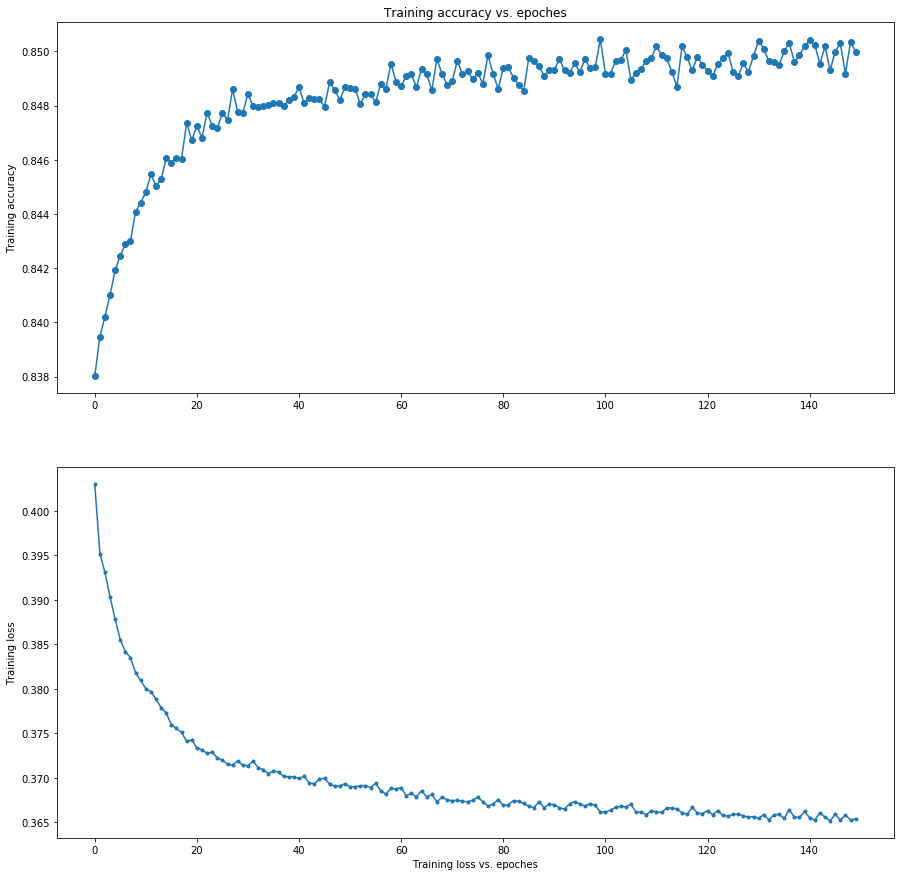

In [367]:
# plot the loss and accuracy per epoch
x1 = range(0, 150)
x2 = range(0, 150)
y1 = Accuracy_list
y2 = Loss_list

plt.figure(figsize=(15,15))
plt.subplot(2, 1, 1)
plt.plot(x1, y1, 'o-')
plt.title('Training accuracy vs. epoches')
plt.ylabel('Training accuracy')
plt.subplot(2, 1, 2)
plt.plot(x2, y2, '.-')
plt.xlabel('Training loss vs. epoches')
plt.ylabel('Training loss')
plt.show()

In [355]:
# Test the model
with torch.no_grad():
    correct = 0
    total = 0
    for test_x, test_y in test_loader:
        test_x = test_x.to(device)
        test_y = test_y.to(device)
        outputs = model(test_x)
        _, predicted = torch.max(outputs.data, 1)
        total += test_y.size(0)
        correct += (predicted == test_y).sum().item()

    print('Accuracy of the network on the test dataset: {} %'.format(100 * correct / total))


Accuracy of the network on the test dataset: 83.01509547135859 %


In [ ]:
# Accuracy of the network on the test dataset: 83.63744545815153 %